# Using OpenCV for Counting Stars
This notebook employs the OpenCV library,```cv2```, to process the images given, and thereafter, count the number of pixels above a certain threshold as stars (using a function from NumPy).

![](https://content.instructables.com/FFX/H4DJ/KAL2VCAR/FFXH4DJKAL2VCAR.png?auto=webp&fit=bounds&frame=1&width=1024)

> **NOT** our work. All the credit goes to [Daniel Hingston](https://www.instructables.com/Star-Recognition-Using-Computer-Vision-OpenCV/).

In [1]:
# these are the main libraries, ...
# the cell below is only there for the published report
import numpy as np
import matplotlib.pyplot as plt
from astropy.nddata import Cutout2D
from astropy import units
from astropy.io import fits
import glob
from astropy.visualization import astropy_mpl_style
from astropy.visualization import simple_norm
from astropy.utils.data import download_file
#from matplotlib.colors import *
from astropy.stats import sigma_clipped_stats
from skimage.filters import median
from skimage.measure import label, regionprops

# Libraries
The main library used was `cv2`, since the approach taken with `skimage` did not result in desirable outcomes.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import median
from skimage.measure import label, regionprops
import cv2

the type of image is <class 'numpy.ndarray'>


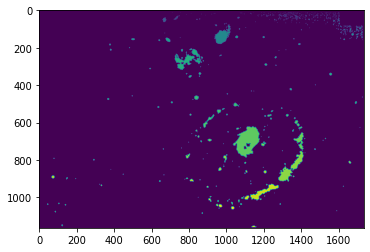

In [4]:
image = fits.getdata("jw02727-o007_t062_miri_f1000w_segm.fits")
plt.imshow(image)
print(f"the type of image is {type(image)}")

In [5]:
# mean, median, std = sigma_clipped_stats(image, sigma=3.0)
#print(f"the shape of image is: {np.shape(image)}, mean is {mean}, median is {median} and std is {std}")

In [6]:
# filtered = image[np.abs(image - mean) < 3 * std]
filtered = median(image, footprint=np.ones((3,3)))

In [7]:
print(f"shape of img: {np.shape(image)} and the shape of filtered: {np.shape(filtered)}")

shape of img: (1163, 1734) and the shape of filtered: (1163, 1734)


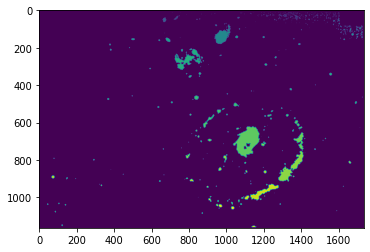

In [8]:
plt.imshow(filtered)

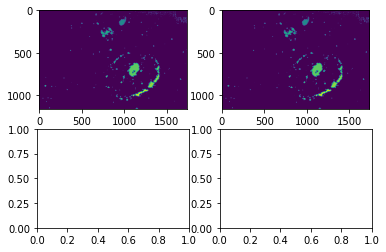

In [9]:
f, axarr = plt.subplots(2,2)
axarr[0,0].imshow(image)
axarr[0,1].imshow(filtered)
#axarr[0,1].imshow()
#axarr[1,1].imshow()

In [10]:
print(image == filtered)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


In [11]:
# arya's convoluted star
image_data = np.asarray(plt.imread("arya.png"))

In [12]:
# carthweel galaxy data 
image_data = fits.getdata("jw02727-o007_t062_miri_f1000w_segm.fits")

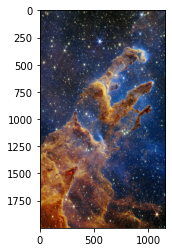

In [13]:
# A Pillars of Creation image found on the internet
image_data = np.asarray(plt.imread("pillars.png"))
plt.imshow(image_data)

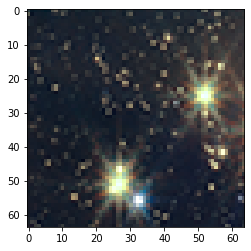

In [14]:
image_data = image_data[:64, :64]
plt.imshow(image_data)

# The SKImage Approach
The aim was to use the `labels` and `regions` functions to identify and label connected regions in the image, and then calculate properties of those regions, such as their area and centroid. By setting a minimum area threshold, one can identify and count the number of regions that are likely to correspond to stars in the image.

In [15]:
labels = label(image_data)
regions = regionprops(labels)

star_count = 0
for region in regions:
    if region.area >= 1:
        star_count += 1
        
print(f"number of stars {star_count}")

number of stars 5


Unfortunately, this number is simply way too low to be even considered close to our approximation. Therefore, after changing the numbers and some parameters, the conclusion was that this method would not work.

In [16]:
print(f"\nbased on the labels {labels}")


based on the labels [[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


In [17]:
print(f"and regions {regions}")

and regions [<skimage.measure._regionprops.RegionProperties object at 0x7f7319ad9850>, <skimage.measure._regionprops.RegionProperties object at 0x7f730f5d2d30>, <skimage.measure._regionprops.RegionProperties object at 0x7f730f4d22e0>, <skimage.measure._regionprops.RegionProperties object at 0x7f730f4d22b0>, <skimage.measure._regionprops.RegionProperties object at 0x7f730f4d2c70>]


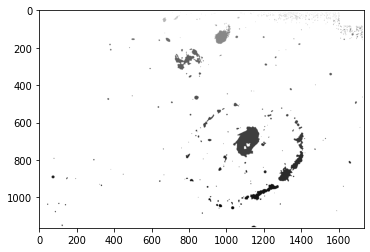

In [18]:
image = fits.getdata("jw02727-o007_t062_miri_f1000w_segm.fits")
plt.imshow(image, cmap="binary")

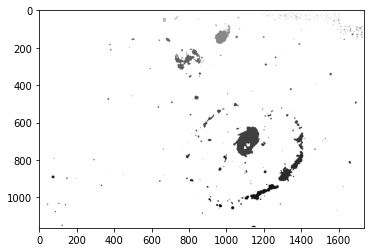

In [19]:
filtered = median(image, footprint=np.ones((3,3)))
plt.imshow(filtered, cmap="binary")

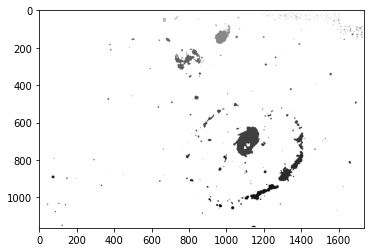

In [20]:
filtered = median(image)
plt.imshow(filtered, cmap="binary")

# Trying Out a New Method Using OpenCV
Here, the plan was to:
1. Convert the image to grayscale for better processing
2. Apply a median filter to reduce noise
3. Use binary and the Otsu thresholds to create a black & white image
4. Detect the stars

In [21]:
import cv2

In [22]:
img = cv2.imread("pillars.png")

In [23]:
np.shape(img)

(2000, 1155, 3)

In [24]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
np.shape(gray)

(2000, 1155)

In [25]:
# using median method to filter
filtered = cv2.medianBlur(gray, 1)
np.shape(filtered)

(2000, 1155)

In [26]:
binary, threshold = cv2.threshold(filtered, 100, 255, cv2.THRESH_BINARY + cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"threshold is: {threshold}\n\nbinary is: {binary}\n\n")

threshold is: [[  0   0   0 ... 255   0   0]
 [255   0   0 ... 255 255   0]
 [  0   0   0 ... 255 255   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]

binary is: 84.0




In [27]:
# use morphological operations to remove the small white dots in the image
"""
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
"""

'\nkernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))\nbinary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)\n'

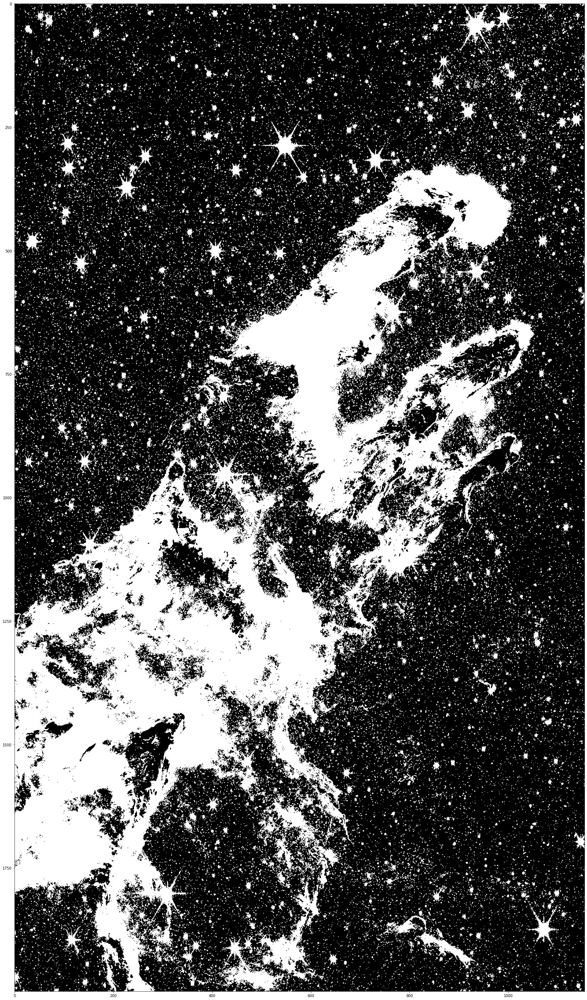

In [28]:
cv2.imwrite('processed_image.jpg', threshold)
img = cv2.imread("processed_image.jpg")
plt.figure(figsize = (50,50))
plt.imshow(img)

In [29]:
num_of_stars = np.count_nonzero(threshold)
print(f"number of stars: {num_of_stars}")

number of stars: 685695


In [30]:
print(f"shape of img: {np.shape(img)}")

shape of img: (2000, 1155, 3)


# For-loop for Counting
This `for`-loop goes over all the pixels to count the number of stars, given that their center has an intensity above the threshold. Meanwhile, the coordinates of the stars will be added to a list for further analysis.

In [31]:
x, y = np.shape(img)[0], np.shape(img)[1]
num_circ = 0
coordinates_list = []
for i in range(x):
    for j in range(y):
        if (threshold[i][j] > 250):
            cv2.circle(img, (i, j), 1, (255, 0, 0))
            num_circ += 1
            coordinates_list.append((i, j))

shape of circ_img is: (2000, 1155, 3) and there are 685695 circles in total
Are the number of stars and circles equal? True


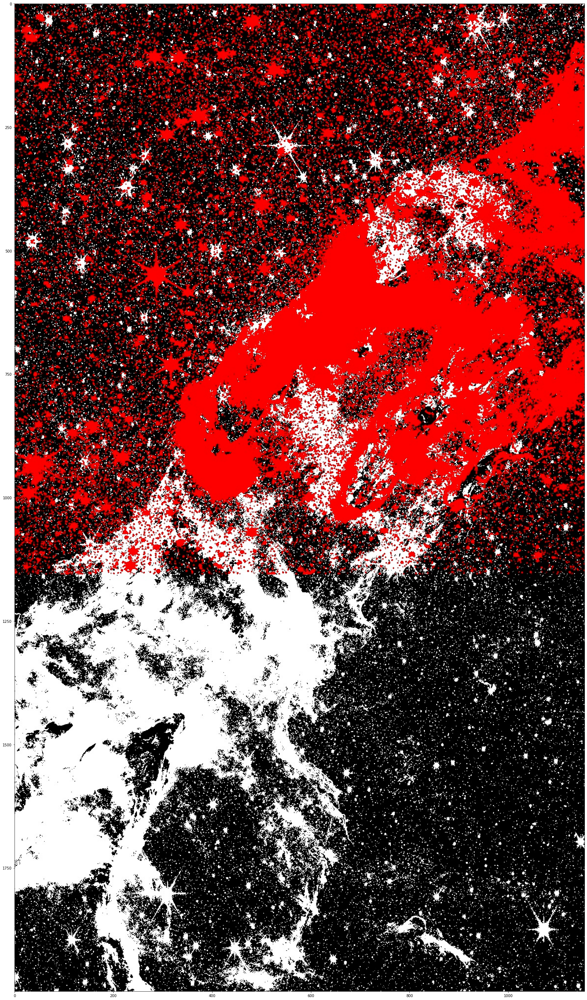

In [32]:
cv2.imwrite("colorful_pillars_circles.jpg", img)
circ_img = cv2.imread("colorful_pillars_circles.jpg")
print(f"shape of circ_img is: {np.shape(circ_img)} and there are {num_circ} circles in total")
print(f"Are the number of stars and circles equal? {num_circ == num_of_stars}")
plt.figure(figsize = (50,50))
plt.imshow(circ_img)

# Histogram of Stars Based on Coordinates
The graph below aims to represent the distribution of stars based on their coordinates, which was earlier captured whilst detecting them.

---

## Note
Due to the large size of the number of stars (affecting the size of the list of coordinates), plotting the whole distribution would be too troublesome for this notebook, hence, only the first 400 datapoints have been selected.

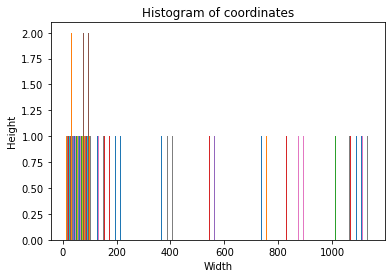

In [33]:
bins = 10
plt.hist(coordinates_list[:400], bins)
plt.title('Histogram of coordinates')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()